In [1]:
from fastai.vision.all import *

In [2]:
def get_label(image_file):
    return image_file.parent.name

In [3]:
def open_as_grayscale_3channels(image_file):
    image = PILImage.create(image_file, mode="L")
    image = np.array(image)[..., None]
    image = np.repeat(image, 3, axis=-1)
    return PILImage.create(image)

In [4]:
learn = load_learner('(160, 214).pkl')
learn.cuda();

In [5]:
data_dir = Path.home() / 'data/Projeto Linda Lifetech - Alysson-Lucas/original models'
image_files = get_image_files(data_dir/'set.2313.train_test/test/Suspeito')
len(image_files)

117

In [6]:
test_dl = learn.dls.test_dl(image_files)

In [7]:
class Hook:
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_func)   
    def hook_func(self, m, i, o): self.stored = o.detach().clone()
    def __enter__(self, *args): return self
    def __exit__(self, *args): self.hook.remove()

In [8]:
xs = []
outputs = []
acts = []

with Hook(learn.model[0]) as hook:
    for x, in test_dl:
        xs.extend(x)
        with torch.no_grad(): 
            output = learn.model.eval()(x.cuda())
            outputs.extend(output)
        act = hook.stored
        acts.extend(act)

In [9]:
preds = torch.stack(outputs).argmax(dim=-1)
preds.sum() / len(preds)

TensorBase(0.7009, device='cuda:0')

In [10]:
act[0].shape

torch.Size([512, 7, 7])

In [11]:
learn.model[1][-1].weight.shape

torch.Size([2, 512])

In [12]:
cam_maps = []
for act in acts:
    cam_map = torch.einsum('ck,kij->cij', learn.model[1][-1].weight, act)
    cam_maps.append(cam_map)

In [13]:
learn.dls.vocab

['NaoSuspeito', 'Suspeito']

In [14]:
from polvo.core import *

In [15]:
shows = []

for i in range(len(xs)):
    def _show(ctx, i=i):
        ax = ctx
        x = xs[i]
        cam_map = cam_maps[i]

        x_dec = TensorImage(test_dl.decode((x,))[0][0])
        x_dec.show(ax=ax, cmap='gray')
        x_show = partial(x_dec.show, cmap='gray')
        ax.imshow(cam_map[1].detach().cpu(), alpha=0.9, extent=(0,214,214,0), interpolation='bilinear', cmap='coolwarm')
        
    x = xs[i]
    x_dec = TensorImage(test_dl.decode((x,))[0][0])
    shows.append(partial(x_dec.show, cmap='gray'))
    
    shows.append(_show)

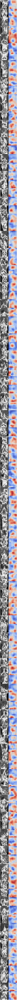

In [18]:
fig, grid = image_grid(shows, ncols=2)

In [19]:
fig.savefig('suspeito.png')